안녕하세요~

이 커널에서는 데이터 내부의 zipcode와 파이썬 folium 라이브러리를 활용해서 실제 Map Visualization을 해보았습니다.

In [1]:
import numpy as np # NumPy is the fundamental package for scientific computing

import pandas as pd # Pandas is an easy-to-use data structures and data analysis tools
pd.set_option('display.max_columns', None) # To display all columns

import matplotlib.pyplot as plt # Matplotlib is a python 2D plotting library
%matplotlib inline 
# A magic command that tells matplotlib to render figures as static images in the Notebook.

import seaborn as sns # Seaborn is a visualization library based on matplotlib (attractive statistical graphics).
sns.set_style('whitegrid') # One of the five seaborn themes
import warnings
warnings.filterwarnings('ignore') # To ignore some of seaborn warning msg

from scipy import stats, linalg

from matplotlib import rcParams
import scipy.stats as st

import folium # for map visualization
from folium import plugins

In [2]:
train = pd.read_csv("../input/2019-2nd-ml-month-with-kakr/train.csv", parse_dates=['date'])
test = pd.read_csv("../input/2019-2nd-ml-month-with-kakr/test.csv", parse_dates=['date'])

In [3]:
# Why are the following features converted to category type?
train['waterfront'] = train['waterfront'].astype('category',ordered=True)
train['view'] = train['view'].astype('category',ordered=True)
train['condition'] = train['condition'].astype('category',ordered=True)
train['grade'] = train['grade'].astype('category',ordered=False) # Why are these ordered 'False'?
train['zipcode'] = train['zipcode'].astype(str)
train.head(2) # Show the first 2 lines

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,2014-10-13,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,1,2015-02-25,180000.0,2,1.0,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062


In [4]:
print(train.shape)
print(train.nunique())

(15035, 21)
id               15035
date               365
price             3263
bedrooms            11
bathrooms           29
sqft_living        863
sqft_lot          7678
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         789
sqft_basement      271
yr_built           116
yr_renovated        65
zipcode             70
lat               4692
long               716
sqft_living15      682
sqft_lot15        6958
dtype: int64


In [5]:
print(train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15035 entries, 0 to 15034
Data columns (total 21 columns):
id               15035 non-null int64
date             15035 non-null datetime64[ns]
price            15035 non-null float64
bedrooms         15035 non-null int64
bathrooms        15035 non-null float64
sqft_living      15035 non-null int64
sqft_lot         15035 non-null int64
floors           15035 non-null float64
waterfront       15035 non-null category
view             15035 non-null category
condition        15035 non-null category
grade            15035 non-null category
sqft_above       15035 non-null int64
sqft_basement    15035 non-null int64
yr_built         15035 non-null int64
yr_renovated     15035 non-null int64
zipcode          15035 non-null object
lat              15035 non-null float64
long             15035 non-null float64
sqft_living15    15035 non-null int64
sqft_lot15       15035 non-null int64
dtypes: category(4), datetime64[ns](1), float64(5), int64(10)

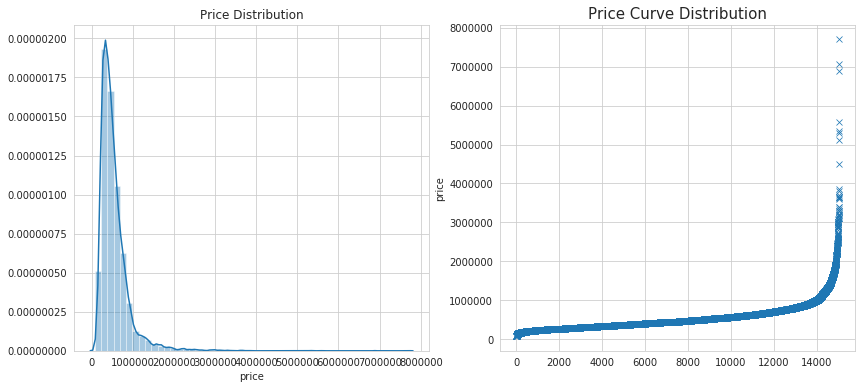

In [6]:
# Knowing the Price variable
f, ax = plt.subplots(1, 2, figsize = (14, 6))
sns.distplot(train['price'], ax=ax[0])
ax[0].set_title('Price Distribution')
plt.xlim()

sns.scatterplot(range(train.shape[0]), train['price'].sort_values(), ax=ax[1], marker="x")
ax[1].set_title('Price Curve Distribution', fontsize=15)

plt.show()

In [7]:
price_des = train.describe()['price']
price_des.astype('int')

count      15035
mean      540682
std       371524
min        78000
25%       322000
50%       450000
75%       645000
max      7700000
Name: price, dtype: int64

타겟인 가격 데이터의 값은 한쪽으로 많이 치우쳐져 있네요.

## Map visualization



In [8]:
houses_map = folium.Map(location = [train['lat'].mean(), train['long'].mean()], zoom_start = 10)
lat_long_data = train[['lat', 'long']].values.tolist()
h_cluster = folium.plugins.FastMarkerCluster(lat_long_data).add_to(houses_map)

houses_map

첫번째로 lat, long 데이터를 이용해서 실제 지도에 몇개씩 분포해 있는지 MarkerCluster로 표현했습니다. 이렇게 MarkerCluster로 표현하게 되면 좀더 쉽게 분포를 확인할 수 있습니다.

In [9]:
houses_heatmap = folium.Map(location = [train['lat'].mean(), train['long'].mean()], zoom_start=9)
houses_heatmap.add_children(plugins.HeatMap([[row['lat'], row['long']] for name, row in train.iterrows()]))
houses_heatmap

두번째로 heatmap으로 표현해볼 수 있습니다. heatmap은 위의 MarkerCluster와 유사한데 단지 형태를 그라데이션으로 표현한 것 뿐입니다.

하지만, Heatmap과 MarkerCluster 로는 집의 분포는 쉽게 확인할 수 있으나, 각 Feature별 분포를 확인하기 위해서는 (예를 들어, 영역별로 집값의 분포, 평방미터의 분포 등) 다른 방법을 사용해야 합니다. 

일단 먼저 zipcode를 활용해서 지도에 각 영역을 표시한 다음에 그 zipcode에 해당하는 데이터의 feature 정보를 지도에 표현해봤습니다.

https://github.com/harlfoxem/House_Price_Prediction/blob/master/zipcode_king_county.geojson

위 사이트에서 zipcode에 따른 영역 표시 파일(geojson)을 가져올 수 있습니다. 제가 이미 이 커널에 추가해 놓았으니 그대로 따라하시면 됩니다. geojson 파일은 위 사이트를 들어가보시면 알 수 있듯이 데이터 내부에 있는 zipcode에 따라 folium 지도에 영역을 표시해 놓은 것입니다.

In [10]:
zipcode_data = train.groupby('zipcode').aggregate(np.mean)

In [11]:
zipcode_data.reset_index(inplace=True)

In [12]:
train['count'] = 1
count_house_zipcode = train.groupby('zipcode').sum()
count_house_zipcode.reset_index(inplace=True)
count_house_zipcode = count_house_zipcode[['zipcode', 'count']]
train.drop(['count'], axis = 1, inplace=True)

In [13]:
zipcode_data = zipcode_data.join(count_house_zipcode.set_index('zipcode'), on='zipcode')

In [14]:
zipcode_data.head()

,zipcode,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,count
0,98001,7887.037657,2.724696e+05,3.368201,1.987448,1841.079498,13400.485356,1.418410,1655.472803,185.606695,1980.280335,49.682008,47.309264,-122.270138,1795.138075,10994.389121,239
1,98002,7944.885496,2.356645e+05,3.320611,1.828244,1648.625954,7352.977099,1.351145,1531.557252,117.068702,1967.358779,60.488550,47.308214,-122.213122,1482.992366,7735.290076,131
2,98003,7123.243243,2.882156e+05,3.318919,2.021622,1872.789189,10698.886486,1.316216,1618.286486,254.502703,1977.589189,0.000000,47.314029,-122.310562,1841.654054,9772.432432,185
3,98004,7636.516746,1.397283e+06,3.894737,2.571770,2997.583732,13424.593301,1.452153,2506.913876,490.669856,1972.110048,220.057416,47.616382,-122.205455,2710.334928,12905.000000,209
4,98005,6271.626087,7.983833e+05,3.895652,2.428261,2665.913043,19577.400000,1.256522,2108.086957,557.826087,1969.052174,52.260870,47.611151,-122.166852,2533.921739,18271.426087,115


In [15]:
def show_zipcode_map(col, bins):
    geo_path = '../input/house-prices-data/zipcode_king_county.geojson'
    zipcode = folium.Map(location=[train['lat'].mean(), train['long'].mean()], zoom_start=9)
    zipcode.choropleth(
        geo_data=geo_path, 
        data=zipcode_data, 
        columns=['zipcode', col],
        key_on='feature.properties.ZCTA5CE10',
        fill_color='OrRd',
        fill_opacity=0.6, 
        line_opacity=0.2,
        bins=bins) # bins로 조절!
#     zipcode.save(col + '.html')
    return zipcode

In [16]:
show_zipcode_map('count', 9)

위 지도는 Marker 지도, HeatMap 과 같은 count map 입니다. zipcode 별로 나눠서 보니 뭔가 더 확실히 보이는거 같아요!
이제 몇몇 feature 별로 확인해봅시다.

feature 설명입니다. ( https://www.kaggle.com/c/2019-2nd-ml-month-with-kakr/data)

1. ID : 집을 구분하는 번호  
1. date : 집을 구매한 날짜  
1. price : 집의 가격(Target variable)  
1. bedrooms : 침실의 수  
1. bathrooms : 화장실의 수  
1. sqft_living : 주거 공간의 평방 피트(면적)  
1. sqft_lot : 부지의 평방 피트(면적)  
1. floors : 집의 층 수  
1. waterfront : 집의 전방에 강이 흐르는지 유무 (a.k.a. 리버뷰)  
1. view : 집이 얼마나 좋아 보이는지의 정도  
1. condition : 집의 전반적인 상태  
1. grade : King County grading 시스템 기준으로 매긴 집의 등급  
1. sqft_above : 지하실을 제외한 평방 피트(면적)  
1. sqft_basement : 지하실의 평방 피트(면적) 
1. yr_built : 지어진 년도   
1. yr_renovated : 집을 재건축한 년도  
1. zipcode : 우편번호  
1. lat : 위도  
1. long : 경도  
1. sqft_living15 : 2015년 기준 주거 공간의 평방 피트(면적, 집을 재건축했다면, 변화가 있을 수 있음)  
1. sqft_lot15 : 2015년 기준 부지의 평방 피트(면적, 집을 재건축했다면, 변화가 있을 수 있음)  

### Price
먼저 각 zipcode별로 가격 분포를 확인해보겠습니다. 각 zipcode 별로 해당 feature의 평균값이 맵에 출력됩니다.

In [17]:
show_zipcode_map('price', 7)

지도 zipcode 섹션 별로, 타겟(price)의 분포를 한눈에 알 수 있습니다. 자세히 보니 Seatle 바로 오른쪽이 유난히 값이 비싼 것을 알 수 있네요! 

찾아보니.. [뉴스기사](http://www.koreadaily.com/news/read.asp?page=1&branch=&source=&category=economy&art_id=6427973)

시애틀 동쪽이 유난히 부자들이 사나봐요.. 우리나라 강남같이..?


### sqft_living, sqft_living15, sqft_lot, sqft_lot15
주거공간의 평방미터와 부지(땅)의 평방피트를 의미합니다.   
위 feature와 sqft_lot(부지의 평방미터)와의 차이는 아마 **집앞 마당의 유무와, 크기의 차이**가 아닐까 생각합니다.  
**(매우 중요한 feature로 사용될 수 있을거 같아요!)**

In [18]:
show_zipcode_map('sqft_lot', 9)

In [19]:
show_zipcode_map('sqft_lot15', 9)

In [20]:
show_zipcode_map('sqft_living', 9)

In [21]:
show_zipcode_map('sqft_living15', 9)

sqft_living(15), sqft_lot(15) 총 4가지 feature를 확인해보면 맵 분포는 비슷한데 스케일링의 차이가 있는거 같습니다. 마치 15feature가 반대 피쳐에 비해 다운스케일링 된거 같은 느낌이 드는데요. 이것만 가지고는 확신할 수 없으니 더 알아보도록하죠.

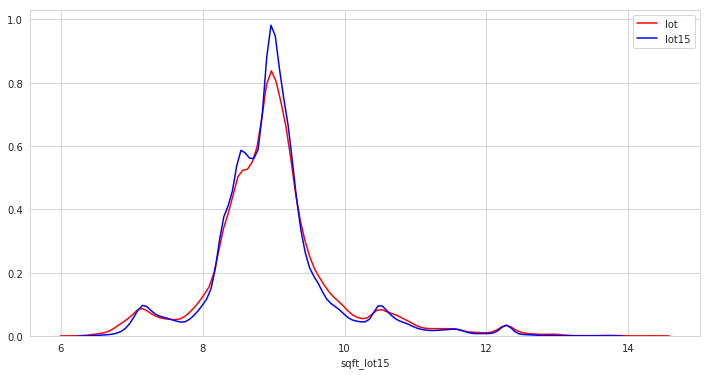

In [22]:
plt.figure(figsize=(12,6))
sns.distplot(np.log(train['sqft_lot']), hist=False, color='r', label='lot')
sns.distplot(np.log(train['sqft_lot15']), hist=False, color='b', label='lot15')
plt.show()

sqft_lot, sqft_lot15 feature의 경우 너무 편향이 심해서 log화 한 후 그래프로 나타내봤습니다. 편향이 심하다는 것은 분포를 벗어난 아웃라이어가 많다는 이야기입니다. 뭔가 스케일링 된 증거는 찾을 수 없고 비교적 비슷한 분포를 그리고 있네요.

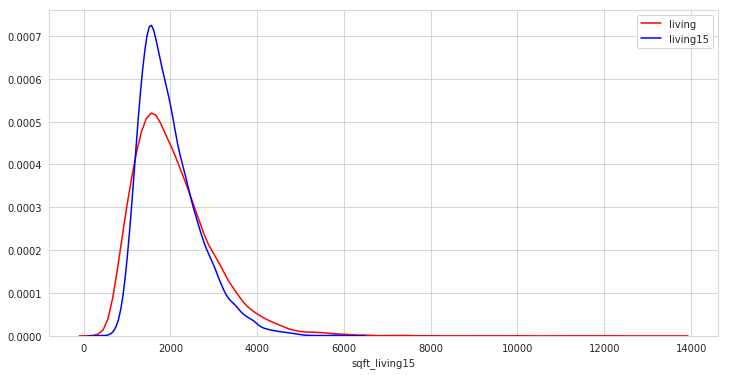

In [23]:
plt.figure(figsize=(12,6))
sns.distplot((train['sqft_living']), hist=False, color='r', label='living')
sns.distplot((train['sqft_living15']), hist=False, color='b', label='living15')
plt.show()

sqft_living도 마찬가지네요. 1500 값이 living15가 living에 비해 50프로 정도 많이 분포해 있네요. 그리고, 빨간색 선(living)을 보니 lot feature와 마찬가지로 아웃라이어가 분포하고 있는 모양입니다.

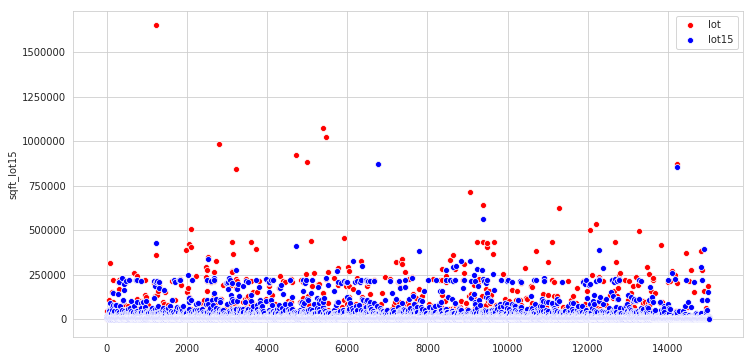

In [24]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=train.index, y='sqft_lot', data=train, color='r', label='lot')
sns.scatterplot(x=train.index, y='sqft_lot15', data=train, color='b', label='lot15')
plt.show()

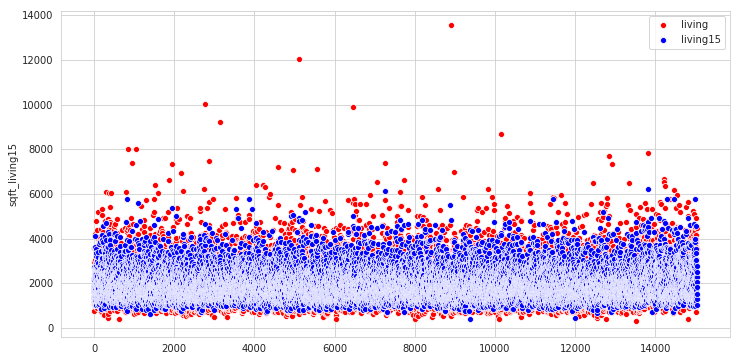

In [25]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=train.index, y=train['sqft_living'], color='r', label='living')
sns.scatterplot(x=train.index, y=train['sqft_living15'], color='b', label='living15')
plt.show()

스캐터 플랏을보니 lot, living 피쳐의 값의 범위가 15값에 비해 넓게 분포해 있는거 같습니다.    
**뭔가 15값은 밀집되어 있는 듯한 느낌인 반면에, living, lot 피쳐는 좀 튀는 느낌이랄까요?**

In [26]:
round(train.describe()[['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_lot15']], 0)

,sqft_living,sqft_living15,sqft_lot,sqft_lot15
count,15035.0,15035.0,15035.0,15035.0
mean,2084.0,1993.0,15297.0,12824.0
std,922.0,691.0,42613.0,27736.0
min,290.0,399.0,520.0,651.0
25%,1430.0,1490.0,5028.0,5100.0
50%,1910.0,1850.0,7620.0,7610.0
75%,2560.0,2360.0,10696.0,10076.0
max,13540.0,6210.0,1651359.0,871200.0


해당 피쳐 Describe를 살펴보니 역시 std에서 15 피쳐들이 작습니다. **마치 정리된 듯한 느낌이에요.**  
그리고, 이 Describe에서 가장 튀는 값이 하나 있네요. 바로 Max값잆니다.

In [27]:
round(train.describe().loc[['75%', 'max'], ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_lot15']], 0)

,sqft_living,sqft_living15,sqft_lot,sqft_lot15
75%,2560.0,2360.0,10696.0,10076.0
max,13540.0,6210.0,1651359.0,871200.0


와.. 몇배나 큰 집인거죠..? 상당히 큰 아웃라이어가 보입니다.

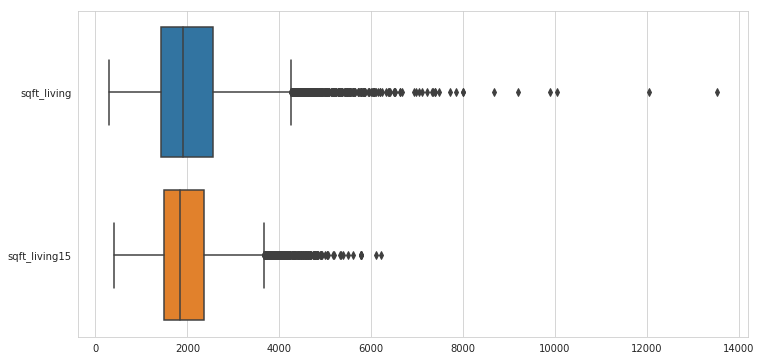

In [28]:
plt.figure(figsize=(12,6))
sns.boxplot(data=train[['sqft_living', 'sqft_living15']], orient='h')
plt.show()

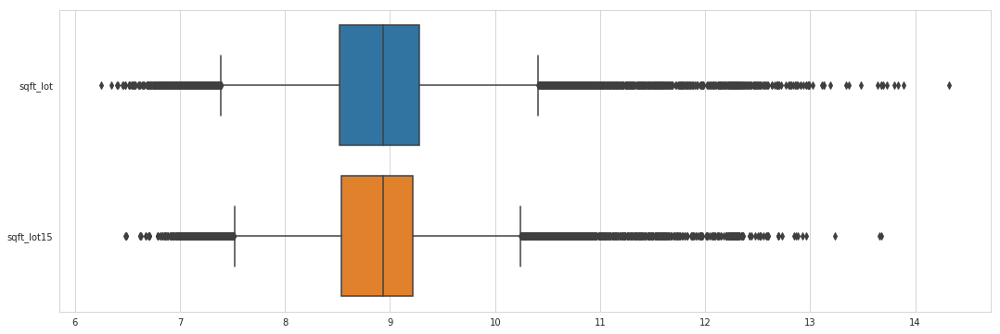

In [29]:
plt.figure(figsize=(18,6))
sns.boxplot(data=np.log(train[['sqft_lot', 'sqft_lot15']]), orient='h')
plt.show()

Boxplot은 그래프를 통해 지금까지 알아봤던 분포, 표준편차, 평균, 아웃라이어를 한눈에 알아볼 수 있습니다. (lot 피쳐는 로그를 취했다는 점 주의하세요!)  
이 아웃라이어를 어떻게 처리하냐에 따라 모델의 성능이 많이 달라질것 같습니다.